# 4. Train model. Random Forest

In [1]:
import time
import pandas as pd
import numpy as np
from pathlib import Path
import os

%matplotlib inline

import matplotlib.pyplot as plt

from sklearn.metrics import (
    roc_auc_score,
    precision_recall_curve,
    average_precision_score,
    ConfusionMatrixDisplay,
)
import joblib
import mlflow
from mlflow.models import infer_signature

from sklearn.ensemble import RandomForestClassifier
import shap
import dtreeviz
from fraudlib.utils import (
    load_features,
    pr_at_thresholds,
    cm_for_threshold,
    explain_confusion_matrix,
    thresholds_grid,
    save_model_thresholds,
    matrix_params
)

In [6]:
upstream = {
    'feature_engineering': {
        'train': 'data/interim/x_train_features_v2.parquet.gzip',
        'val': 'data/interim/x_val_features_v2.parquet.gzip',
        'test': 'data/interim/x_test_features_v2.parquet.gzip'
    }
}
product = None
ROOT = Path(os.path.abspath("")).resolve().parents[0]
DATA = os.path.join(ROOT, "data")
INTERIM_DATA = os.path.join(DATA, "interim")
VERSION = "v2"
PLOTS = os.path.join(ROOT, "reports", "figures")
MLFLOW_URI = os.getenv('MLFLOW_URI', f'file:{os.path.join(DATA, 'mlflow')}')

## MLFlow setup

Setup storage for MLFLow data:

In [3]:
mlflow.set_tracking_uri(MLFLOW_URI)

## Load data

If files `x_{train,val,test}_features.parquet.gzip` are not exist - previous step [03_02_feature_eng_v1.ipynb](./03_02_feature_eng_v1.ipynb) / [03_02_feature_eng_v2.ipynb](03_02_feature_eng_v2.ipynb) should be executed

In [4]:
X_train = pd.read_parquet(
    os.path.join(INTERIM_DATA, f"x_train_features_{VERSION}.parquet.gzip")
)
X_val = pd.read_parquet(
    os.path.join(INTERIM_DATA, f"x_val_features_{VERSION}.parquet.gzip")
)
X_test = pd.read_parquet(
    os.path.join(INTERIM_DATA, f"x_test_features_{VERSION}.parquet.gzip")
)

y_train = X_train["tx_fraud"]
y_val = X_val["tx_fraud"]
y_test = X_test["tx_fraud"]

FEATURES = load_features(
    os.path.join(INTERIM_DATA, f"features_{VERSION}.yaml")
)
FEATURES

['tx_amount',
 'sector_id',
 'tx_amount_log',
 'hour',
 'month',
 'is_month_start',
 'is_month_end',
 'is_weekend',
 'tx_amount_log_mean',
 'tx_amount_log_std',
 'tx_amount_log_deviates',
 'secs_since_prev_tx',
 'burst_id',
 'n_tx_in_burst',
 'burst_mean',
 'burst_std',
 'n_trx_per_burst_deviates',
 'hour_zscore',
 'hour_zscore_deviates',
 'rolling_median',
 'q1',
 'q3',
 'iqr',
 'amount_robust_rolling20',
 'is_amount_robust_rolling_outlier',
 'day_of_week_mean',
 'day_of_week_std',
 'is_day_of_week_mean_outlier',
 'day_of_week_zscore',
 'is_day_of_week_zscore_outlier',
 'n_tx_in_prev_24h',
 'q90_prev',
 'is_24h_burst',
 'is_24h_burst_fixed',
 'day_of_week',
 'z_in_day_robust',
 'is_anomalous_in_day',
 'fraud_burst_candidate']

## Train model

In [34]:
default_params = {
    'class_weight': "balanced_subsample",
    'n_jobs': -1,
    'random_state': 42
}

In [37]:
start = time.perf_counter()
rf = RandomForestClassifier(**default_params)
rf.fit(X_train[FEATURES], y_train)
y_rf_pred_proba = rf.predict_proba(X_val[FEATURES])[:, 1]
end = time.perf_counter()

roc_auc = roc_auc_score(y_val, y_rf_pred_proba)
pr_auc = average_precision_score(y_val, y_rf_pred_proba)
exec_time = end - start

print(f"ROC AUC: {roc_auc:.3f}")
print(f"PR AUC: {pr_auc:.3f}")
print(f"Execution time: {exec_time:.3f}")

ROC AUC: 0.939
PR AUC: 0.479
Execution time: 36.488


### MLFlow tracking

In [9]:
mlflow.set_experiment("random_forest_no_params")
init_run_id = None
with mlflow.start_run(run_name="init_run") as run:
    init_run_id = run.info.run_id
    mlflow.log_params(default_params)
    mlflow.log_metric("roc_auc_score", roc_auc)
    mlflow.log_metric("acerage_precision_score", pr_auc)
    mlflow.log_metric("execution_time", exec_time)
    signature = infer_signature(X_train[FEATURES], y_rf_pred_proba)
    model_info = mlflow.sklearn.log_model(
        sk_model=rf,
        name="Random Forest",
        signature=signature,
        input_example=X_train[FEATURES],
        registered_model_name="fraud-detection-random-forest",
    )
    mlflow.set_logged_model_tags(
        model_info.model_id, {"Training Info": "Basic Random Forest model for transactions with v2 features"}
    )

/Users/vadim.sokoltsov/learning/fraud_transactions_tech_assignment/.venv/lib/python3.12/site-packages/mlflow/types/utils.py:452: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
Registered model 'fraud-detection-random-forest' already exists. Creating a new version of this model...
Created version '4' of model 'fraud-detection-random-forest'.


## Visualization

### Precision-recall curve

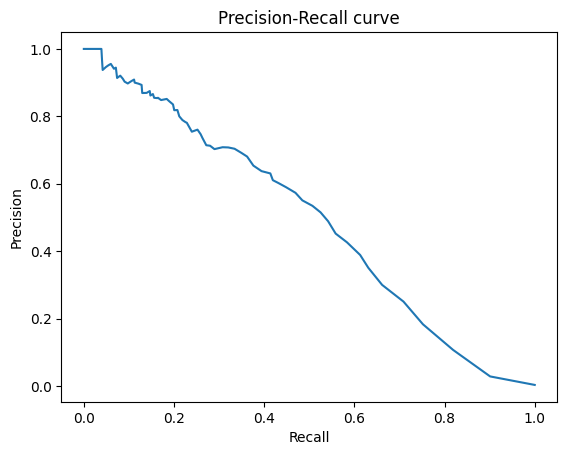

In [38]:
precision, recall, thresholds = precision_recall_curve(y_val, y_rf_pred_proba)
plt.plot(recall, precision)
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.title("Precision-Recall curve")

if init_run_id is not None:
    plot_path = os.path.join(PLOTS, 'rf_precision_recall_curve_init.png')
    plt.savefig(plot_path)
    mlflow.log_artifact(plot_path, run_id=init_run_id)

plt.show()

## Threshold grid

In [39]:
grid_df = thresholds_grid(y_rf_pred_proba, y_val)
max_f1 = grid_df[grid_df["f1"] == grid_df["f1"].max()]
max_f05 = grid_df[grid_df["f0.5"] == grid_df["f0.5"].max()]
max_f2 = grid_df[grid_df["f2"] == grid_df["f2"].max()]
grid_df

,thr,precision,recall,f1,f0.5,f2,TP,FP,FN,TN
0,0.00,0.003098,1.000000,0.006176,0.003869,0.015298,718,231078,0,0
1,0.01,0.028290,0.901114,0.054858,0.035088,0.125670,647,22223,71,208855
2,0.02,0.106987,0.818942,0.189250,0.129504,0.351338,588,4908,130,226170
3,0.03,0.182989,0.752089,0.294358,0.215621,0.463679,540,2411,178,228667
4,0.04,0.250369,0.708914,0.370047,0.287571,0.518858,509,1524,209,229554
...,...,...,...,...,...,...,...,...,...,...
79,0.82,1.000000,0.009749,0.019310,0.046917,0.012157,7,0,711,231078
80,0.83,1.000000,0.008357,0.016575,0.040431,0.010424,6,0,712,231078
81,0.85,1.000000,0.006964,0.013831,0.033875,0.008690,5,0,713,231078
82,0.86,1.000000,0.005571,0.011080,0.027248,0.006954,4,0,714,231078


## Precision-recall curve with marked thresholds

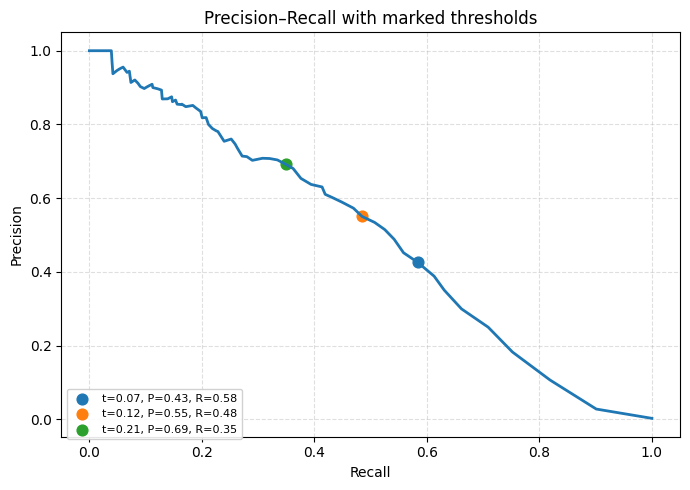

In [13]:
fig, ax = plt.subplots(figsize=(7, 5))
ax.plot(recall, precision, lw=2)

mark_thrs = [max_f2.thr.values[0], max_f1.thr.values[0], max_f05.thr.values[0]]

points = pr_at_thresholds(mark_thrs, thresholds, precision, recall)

handles = []
for t, p, r, i in points:
    plt.scatter(r, p, s=60, label=f"t={t:.2f}, P={p:.2f}, R={r:.2f}")
plt.legend(fontsize=8, loc="lower left")

ax.legend(
    fontsize=8, loc="lower left", bbox_to_anchor=(0, -0.02), ncol=1, framealpha=0.9
)
ax.set_xlabel("Recall")
ax.set_ylabel("Precision")
ax.set_title("Precision–Recall with marked thresholds")
ax.grid(True, ls="--", alpha=0.4)
plt.tight_layout()

if init_run_id is not None:
    plot_path = os.path.join(PLOTS, 'rf_precision_recall_curve_with_thrs_init.png')
    plt.savefig(plot_path)
    mlflow.log_artifact(plot_path, run_id=init_run_id)

plt.show()

## Confusion matrixes for thresholds

In [40]:
rows = []
for thr in mark_thrs + [0.001, 0.01, 0.1, 0.2, 0.3, 0.4, 0.5]:
    conf_matrix = cm_for_threshold(thr, y_rf_pred_proba, y_val)
    params = matrix_params(conf_matrix)
    rows.append((
        thr,
        params['precision'],
        params['recall'],
        params['accuracy'],
        params['false_positive_rate'],
        params['false_negative_rate'],
    ))
cm_df = pd.DataFrame(rows, columns=[
    'thr',
    'precision',
    'recall',
    'accuracy',
    'false_positive_rate',
    'false_negative_rate'
])
cm_df.sort_values(by=['accuracy'], ascending=False).sort_values(by=['false_negative_rate'], ascending=True)

,thr,precision,recall,accuracy,false_positive_rate,false_negative_rate
3,0.001,0.028290,0.901114,0.903821,0.096171,0.098886
4,0.010,0.028290,0.901114,0.903821,0.096171,0.098886
5,0.100,0.488693,0.541783,0.996825,0.001761,0.458217
6,0.200,0.653753,0.376045,0.997450,0.000619,0.623955
7,0.300,0.746988,0.259053,0.997433,0.000273,0.740947
8,0.400,0.844720,0.189415,0.997381,0.000108,0.810585
9,0.500,0.869565,0.139276,0.997269,0.000065,0.860724
0,0.607,0.920635,0.080780,0.997131,0.000022,0.919220
1,0.700,0.952381,0.055710,0.997066,0.000009,0.944290
2,0.826,1.000000,0.008357,0.996928,0.000000,0.991643


### Plot best confusion matrix

For the threshold 0.001:
Precision: 0.028 (Among all of the transactions, ~2.829% are fraud)
Recall: 0.901 (Model found ~90.111% fraud transactions)
Accuracy: 0.904 (Overall accuracy of the model)
False blocks of transactions: ~9.617%
Missed ~9.889% of fraud transactions


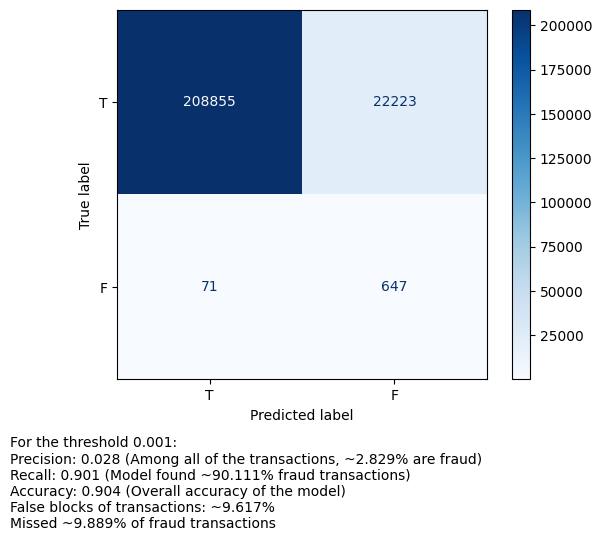

In [41]:
thr_ = 0.001
conf_matrix_best = cm_for_threshold(thr_, y_rf_pred_proba, y_val)
metrics_ = explain_confusion_matrix(conf_matrix_best, thr_)
disp = ConfusionMatrixDisplay(
    confusion_matrix=conf_matrix_best, display_labels=["T", "F"]
)
disp.plot(cmap="Blues")
disp.figure_.text(0, -0.2, "\n".join(metrics_))
print("\n".join(metrics_))

if init_run_id is not None:
    plot_path = os.path.join(PLOTS, 'rf_confusion_matrix_init.png')
    disp.figure_.savefig(plot_path)
    mlflow.log_artifact(plot_path, run_id=init_run_id)

## Tune model

* For tuning, use [optuna](https://github.com/optuna/optuna) library

In [43]:
from sklearn.model_selection import train_test_split

Xtr_sub, _, ytr_sub, _ = train_test_split(
    X_train, y_train,
    test_size=0.7,
    stratify=y_train,
    random_state=42
)

Xva_sub, _, yva_sub, _ = train_test_split(
    X_val, y_val,
    test_size=0.7,
    stratify=y_val,
    random_state=42
)

print(Xtr_sub.shape, ytr_sub.mean())
print(Xva_sub.shape, yva_sub.mean())

(257783, 48) 0.0030413176974431982
(69538, 48) 0.0030918346803186746


In [45]:
import optuna

mlflow.set_experiment("random_forest_optuna_tuning")
Xtr = Xtr_sub[FEATURES].to_numpy(copy=False)
ytr = ytr_sub.to_numpy()
Xva = Xva_sub[FEATURES].to_numpy(copy=False)
yva = yva_sub.to_numpy()

def objective(trial):
    tune_params = {
        "criterion": trial.suggest_categorical("criterion", ["gini", "entropy"]),
        "n_estimators": trial.suggest_int("n_estimators", 200, 800, step=200),
        "max_depth": trial.suggest_int("max_depth", 8, 12),
        "min_samples_split": trial.suggest_int("min_samples_split", 2, 20),
        "min_samples_leaf": trial.suggest_int("min_samples_leaf", 2, 10),
        "max_features": trial.suggest_categorical("max_features", ["sqrt", 0.5]),
        "max_samples": trial.suggest_float("max_samples", 0.5, 0.7),
        "bootstrap": True,
        **default_params
    }

    with mlflow.start_run(nested=True, run_name=f"trial_{trial.number}"):
        mlflow.log_params(tune_params)
        rf = RandomForestClassifier(
            **tune_params
        )
        steps = [200, 400, tune_params["n_estimators"]]
        steps = sorted(set(steps))
        best_ap = -np.inf
        for step in steps:
            rf.set_params(n_estimators=step)
            rf.fit(Xtr, ytr)

            proba = rf.predict_proba(Xva)[:, 1]
            ap = average_precision_score(yva, proba)
            best_ap = max(best_ap, ap)

            mlflow.log_metric("ap_val", float(ap), step=int(step))
            trial.report(ap, step=int(step))
            if trial.should_prune():
                raise optuna.TrialPruned()
        return best_ap


study = optuna.create_study(
    direction="maximize",
    pruner=optuna.pruners.MedianPruner(n_warmup_steps=1),
    sampler=optuna.samplers.TPESampler(seed=42)
)
with mlflow.start_run(run_name="rf_optuna_study"):
    mlflow.log_params({
        "optuna_pruner": "MedianPruner",
        "optuna_sampler": "TPE(seed=42)",
        "direction": "maximize",
        "metric": "average_precision_score"
    })

    start = time.perf_counter()
    study.optimize(objective, n_trials=10, show_progress_bar=True, n_jobs=1)
    exec_time = time.perf_counter() - start
 
    mlflow.log_metric("best_ap_val", float(study.best_value))
    mlflow.log_metric("executution_time", float(exec_time))
    mlflow.log_params({f"best_{k}": v for k, v in study.best_params.items()})

[I 2025-11-05 23:03:04,278] A new study created in memory with name: no-name-f18506db-d528-4890-b1b4-994684369853


  0%|          | 0/10 [00:00<?, ?it/s]

[I 2025-11-05 23:06:10,260] Trial 0 finished with value: 0.5565069005183921 and parameters: {'criterion': 'entropy', 'n_estimators': 600, 'max_depth': 10, 'min_samples_split': 4, 'min_samples_leaf': 3, 'max_features': 0.5, 'max_samples': 0.6202230023486417}. Best is trial 0 with value: 0.5565069005183921.
[I 2025-11-05 23:09:09,385] Trial 1 finished with value: 0.2952095289880946 and parameters: {'criterion': 'gini', 'n_estimators': 800, 'max_depth': 12, 'min_samples_split': 6, 'min_samples_leaf': 3, 'max_features': 0.5, 'max_samples': 0.6049512863264476}. Best is trial 0 with value: 0.5565069005183921.
[I 2025-11-05 23:11:42,478] Trial 2 finished with value: 0.2938450406416782 and parameters: {'criterion': 'gini', 'n_estimators': 600, 'max_depth': 8, 'min_samples_split': 7, 'min_samples_leaf': 5, 'max_features': 0.5, 'max_samples': 0.539934756431672}. Best is trial 0 with value: 0.5565069005183921.
[I 2025-11-05 23:13:08,369] Trial 3 finished with value: 0.5457194724346094 and paramet

In [44]:
best_params = {
    "bootstrap": True,
    **default_params,
    **study.best_trial.params
}
best_ap = study.best_value
print("Best AP:", best_ap,)
print("Params:", best_params)
print("Time:", exec_time)

Best AP: 0.5565069005183921
Params: {'bootstrap': True, 'class_weight': 'balanced_subsample', 'n_jobs': -1, 'random_state': 42, 'criterion': 'entropy', 'n_estimators': 600, 'max_depth': 10, 'min_samples_split': 4, 'min_samples_leaf': 3, 'max_features': 0.5, 'max_samples': 0.6202230023486417}
Time: 36.48785066600249


## Train with best parameters

In [21]:
mlflow.set_experiment("random_forest_best_params")
run_id = None
with mlflow.start_run(run_name="final_train") as run:
    run_id = run.info.run_id

    start = time.perf_counter()
    rf = RandomForestClassifier(
        **best_params,
    )
    rf.fit(X_train[FEATURES], y_train)
    y_rf_pred_proba = rf.predict_proba(X_test[FEATURES])[:, 1]
    exec_time = time.perf_counter() - start

    roc_auc = roc_auc_score(y_test, y_rf_pred_proba)
    pr_auc = average_precision_score(y_test, y_rf_pred_proba)

    mlflow.log_metric("roc_auc_score", roc_auc)
    mlflow.log_metric("average_precision_score", pr_auc)
    mlflow.log_metric("execution_time", exec_time)
    mlflow.log_params(best_params)
    mlflow.set_tags({
        "stage": "final_test",
        "features": "v2",
        "model_type": "RandomForestClassifier"
    })
    signature = infer_signature(X_train[FEATURES], y_rf_pred_proba)
    model_info = mlflow.sklearn.log_model(
        sk_model=rf,
        signature=signature,
        input_example=X_train[FEATURES],
        name="RandomForest",
        registered_model_name="fraud-detection-random-forest",
    )
    mlflow.set_logged_model_tags(
        model_info.model_id, {"Training Info": "Final Random Forest model for transactions with v2 features"}
    )

    print(f"ROC AUC: {roc_auc:.3f}")
    print(f"PR AUC: {pr_auc:.3f}")
    print(f"Time: {exec_time}")

/Users/vadim.sokoltsov/learning/fraud_transactions_tech_assignment/.venv/lib/python3.12/site-packages/mlflow/types/utils.py:452: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.


ROC AUC: 0.989
PR AUC: 0.524
Time: 294.1955967499962


Registered model 'fraud-detection-random-forest' already exists. Creating a new version of this model...
Created version '6' of model 'fraud-detection-random-forest'.


## Visualization

### Precision-recall curve

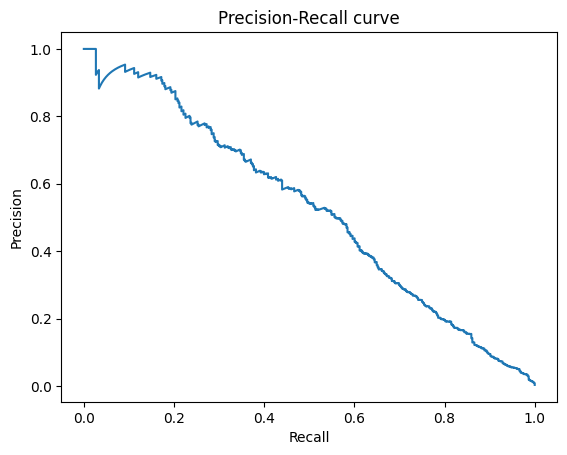

In [22]:
precision, recall, thresholds = precision_recall_curve(y_test, y_rf_pred_proba)
plt.plot(recall, precision)
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.title("Precision-Recall curve")

if run_id is not None:
    plot_path = os.path.join(PLOTS, 'rf_precision_recall_curve_best.png')
    plt.savefig(plot_path)
    mlflow.log_artifact(plot_path, run_id=run_id)
plt.show()

## Threshold grid

In [23]:
grid_df = thresholds_grid(y_rf_pred_proba, y_test)
max_f1 = grid_df[grid_df["f1"] == grid_df["f1"].max()]
max_f05 = grid_df[grid_df["f0.5"] == grid_df["f0.5"].max()]
max_f2 = grid_df[grid_df["f2"] == grid_df["f2"].max()]
grid_df

,thr,precision,recall,f1,f0.5,f2,TP,FP,FN,TN
0,0.000,0.003227,1.000000,0.006432,0.004030,0.015927,448,138399,0,0
1,0.001,0.005208,1.000000,0.010361,0.006501,0.025507,448,85580,0,52819
2,0.002,0.006478,1.000000,0.012874,0.008085,0.031574,448,68704,0,69695
3,0.003,0.007401,1.000000,0.014693,0.009234,0.035941,448,60085,0,78314
4,0.004,0.008135,1.000000,0.016139,0.010148,0.039394,448,54621,0,83778
...,...,...,...,...,...,...,...,...,...,...
918,0.994,1.000000,0.015625,0.030769,0.073529,0.019455,7,0,441,138399
919,0.995,1.000000,0.006696,0.013304,0.032609,0.008357,3,0,445,138399
920,0.996,1.000000,0.006696,0.013304,0.032609,0.008357,3,0,445,138399
921,0.997,1.000000,0.002232,0.004454,0.011062,0.002789,1,0,447,138399


## Precision-recall curve with marked thresholds

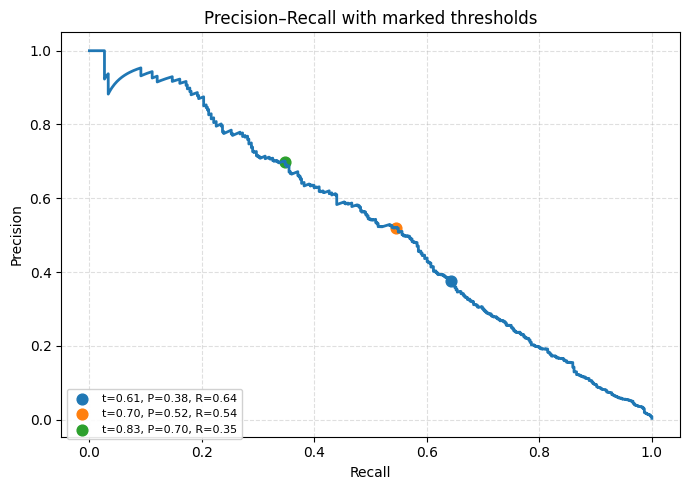

In [25]:
fig, ax = plt.subplots(figsize=(7, 5))
ax.plot(recall, precision, lw=2)

mark_thrs = [max_f2.thr.values[0], max_f1.thr.values[0], max_f05.thr.values[0]]

points = pr_at_thresholds(mark_thrs, thresholds, precision, recall)

handles = []
for t, p, r, i in points:
    plt.scatter(r, p, s=60, label=f"t={t:.2f}, P={p:.2f}, R={r:.2f}")
plt.legend(fontsize=8, loc="lower left")

ax.legend(
    fontsize=8, loc="lower left", bbox_to_anchor=(0, -0.02), ncol=1, framealpha=0.9
)
ax.set_xlabel("Recall")
ax.set_ylabel("Precision")
ax.set_title("Precision–Recall with marked thresholds")
ax.grid(True, ls="--", alpha=0.4)
plt.tight_layout()

if run_id is not None:
    plot_path = os.path.join(PLOTS, 'rf_precision_recall_curve_with_thrs_best.png')
    plt.savefig(plot_path)
    mlflow.log_artifact(plot_path, run_id=run_id)
plt.show()

## Confusion matrices for thresholds

In [26]:
rows = []
for thr in mark_thrs + [0.001, 0.1, 0.15, 0.2]:
    conf_matrix = cm_for_threshold(thr, y_rf_pred_proba, y_test)
    params = matrix_params(conf_matrix)
    rows.append((
        thr,
        params['precision'],
        params['recall'],
        params['accuracy'],
        params['false_positive_rate'],
        params['false_negative_rate'],
    ))
cm_df = pd.DataFrame(rows, columns=[
    'thr',
    'precision',
    'recall',
    'accuracy',
    'false_positive_rate',
    'false_negative_rate'
])
cm_df.sort_values(by=['accuracy'], ascending=False).sort_values(by=['false_negative_rate'], ascending=True)

,thr,precision,recall,accuracy,false_positive_rate,false_negative_rate
3,0.001,0.005208,1.000000,0.383638,0.618357,0.000000
4,0.100,0.047091,0.966518,0.936787,0.063310,0.033482
5,0.150,0.066741,0.930804,0.957781,0.042132,0.069196
6,0.200,0.089065,0.901786,0.969924,0.029856,0.098214
0,0.607,0.376302,0.645089,0.995405,0.003461,0.354911
1,0.700,0.521277,0.546875,0.996917,0.001626,0.453125
2,0.826,0.696429,0.348214,0.997407,0.000491,0.651786


In [27]:
cm_df.sort_values(by=['accuracy'], ascending=False).sort_values(by=['false_negative_rate'], ascending=True)

,thr,precision,recall,accuracy,false_positive_rate,false_negative_rate
3,0.001,0.005208,1.000000,0.383638,0.618357,0.000000
4,0.100,0.047091,0.966518,0.936787,0.063310,0.033482
5,0.150,0.066741,0.930804,0.957781,0.042132,0.069196
6,0.200,0.089065,0.901786,0.969924,0.029856,0.098214
0,0.607,0.376302,0.645089,0.995405,0.003461,0.354911
1,0.700,0.521277,0.546875,0.996917,0.001626,0.453125
2,0.826,0.696429,0.348214,0.997407,0.000491,0.651786


In [42]:
thr_ = 0.1
conf_matrix_best = cm_for_threshold(thr_, y_rf_pred_proba, y_test)
metrics_ = explain_confusion_matrix(conf_matrix_best, thr_)
disp = ConfusionMatrixDisplay(
    confusion_matrix=conf_matrix_best, display_labels=["T", "F"]
)
disp.plot(cmap="Blues")
disp.figure_.text(0, -0.2, "\n".join(metrics_))
print("\n".join(metrics_))

if run_id is not None:
    plot_path = os.path.join(PLOTS, 'rf_confusion_matrix_best.png')
    disp.figure_.savefig(plot_path)
    mlflow.log_artifact(plot_path, run_id=run_id)

ValueError: Found input variables with inconsistent numbers of samples: [138847, 231796]

## Observations

* Best model result is achived with threshold `0.1`

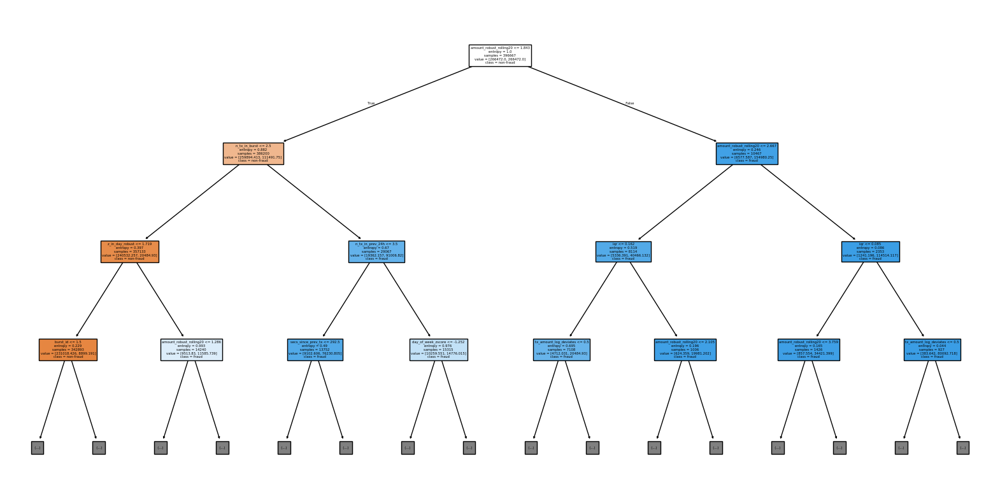

In [28]:
from sklearn.tree import plot_tree
import matplotlib.pyplot as plt

tree = rf.estimators_[0]

plt.figure(figsize=(20, 10))
plot_tree(
    tree,
    feature_names=FEATURES,
    class_names=["non-fraud", "fraud"],
    filled=True,
    max_depth=3,
)

if run_id is not None:
    plot_path = os.path.join(PLOTS, 'rf_sklearn_tree.png')
    plt.savefig(plot_path)
    mlflow.log_artifact(plot_path, run_id=run_id)
plt.show()

## Feature importance

### Shap

#### Sample datasets


So it would not take a lot of time

In [29]:
start = time.perf_counter()
snap_params = best_params
snap_params["n_estimators"] = 100
rf_snap = RandomForestClassifier(
    **snap_params,
)
rf_snap.fit(X_train[FEATURES], y_train)
y_rf_pred_proba_snap = rf_snap.predict_proba(X_test[FEATURES])[:, 1]

sample_frac = 0.1
X_s = X_val[FEATURES].sample(n=min(5000, len(X_val)), random_state=42, weights=None)
y_s = y_val.loc[X_s.index]
sample_exec_time = time.perf_counter() - start
print(f"Sampling dataset time: {sample_exec_time}")

Sampling dataset time: 56.84853233300964


In [30]:
mlflow.set_experiment("random_forest_snap_feature_importance")
run_id = None
with mlflow.start_run(run_name="feature_importance") as run:
    run_id = run.info.run_id
    start = time.perf_counter()
    explainer = shap.TreeExplainer(
        rf_snap, feature_perturbation="tree_path_dependent", model_output="raw"
    )
    shap_vals = explainer.shap_values(X_s[FEATURES], check_additivity=False)
    exec_time = time.perf_counter() - start
    print(f"Snap exec time: {exec_time}")
    mlflow.log_metric("execution_time", exec_time)

Snap exec time: 18.51252462499542


In [31]:
sv = shap_vals
if isinstance(sv, list):
    sv = sv[1]

assert sv.shape[1] == X_s.shape[1], (
    f"SHAP features {sv.shape[1]} != X columns {X_s.shape[1]}"
)

if shap_vals.ndim == 3:
    pos_idx = int(np.where(rf.classes_ == 1)[0][0])
    vals = shap_vals[:, :, pos_idx]

mean_abs = np.abs(vals).mean(axis=0)
shap_mean = pd.DataFrame({"feature": FEATURES, "mean_abs_shap": mean_abs}).sort_values(
    "mean_abs_shap", ascending=False
)
shap_mean

,feature,mean_abs_shap
23,amount_robust_rolling20,0.140598
13,n_tx_in_burst,0.111318
11,secs_since_prev_tx,0.054182
10,tx_amount_log_deviates,0.032011
35,z_in_day_robust,0.027733
22,iqr,0.025821
24,is_amount_robust_rolling_outlier,0.025215
2,tx_amount_log,0.014150
0,tx_amount,0.013999
16,n_trx_per_burst_deviates,0.013460


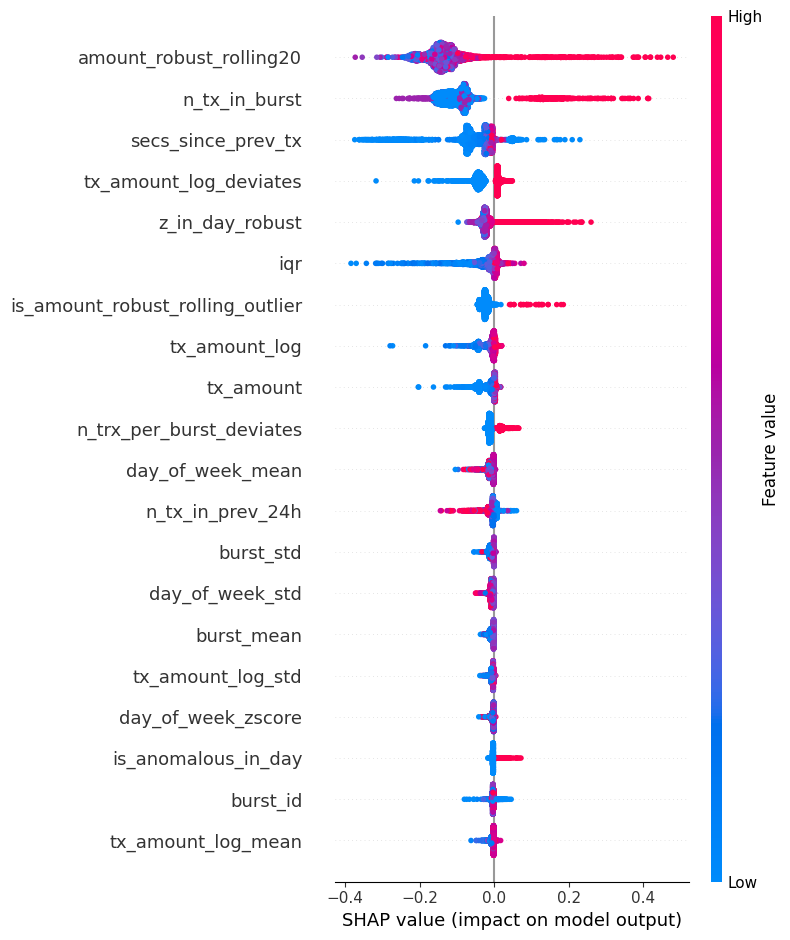

In [32]:
shap.summary_plot(vals, X_s, show=False)
plt.tight_layout()

if run_id is not None:
    plot_path = os.path.join(PLOTS, 'rf_snap_plot.png')
    plt.savefig(plot_path)
    mlflow.log_artifact(plot_path, run_id=run_id)

plt.show()

## dtreeviz

In [34]:
X_arr = X_train[FEATURES].to_numpy()
y_arr = np.asarray(y_train).ravel().astype(int)

classes = {0: "non-fraud", 1: "fraud"}

tree = rf_snap.estimators_[0]

viz = dtreeviz.model(
    tree,
    X_arr,
    y_arr,
    feature_names=[str(f) for f in FEATURES],
    target_name="fraud",
    class_names=classes,
)

In [35]:
rf_view = viz.view(x=X_arr[0])
rf_view_lr = viz.view(x=X_arr[0], orientation="LR")

dtree_lr_plot_path = os.path.join(PLOTS, "random_forest_visual_lr.svg")
dtree_plot_path = os.path.join(PLOTS, "random_forest_visual.svg")

rf_view_lr.save(dtree_lr_plot_path)
rf_view.save(dtree_plot_path)

if run_id is not None:
    mlflow.log_artifact(dtree_lr_plot_path, run_id=run_id)
    mlflow.log_artifact(dtree_plot_path, run_id=run_id)

rf_view

Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x

## Save model

In [36]:
joblib.dump(rf, os.path.join(DATA, "models/random_forest.pkl"))

['/Users/vadim.sokoltsov/learning/fraud_transactions_tech_assignment/data/models/random_forest.pkl']

### Save thresholds

In [38]:
save_model_thresholds(os.path.join(DATA, "models/thresholds.yaml"), {"random_forest": 0.1})
if run_id is not None:
    mlflow.log_param("best_threshold", 0.1)

Key 'random_forest' is already in thresholds
